In [1]:
import os
import zipfile
import tensorflow as tf
import numpy as np
# from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import tensorflow.keras as keras

from glob import glob

import pandas as pd
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding

from keras import layers
from keras import Model, Input
from keras.applications.densenet import DenseNet201

from keras.callbacks import ReduceLROnPlateau, EarlyStopping

import torchvision.models as models
%matplotlib inline
import matplotlib.pyplot as plt

# Preprocessing

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#penyu hijau
import os
folder_path = (r'/content/drive/MyDrive/DGU_Ensemble model/original_dataset_penyu/Chelonia mydas')
test = os.listdir(folder_path)
for fichier in test: 
    if not(fichier.endswith(".jpg")):
        os.remove(os.path.join(folder_path, fichier))

In [4]:
#penyu lekang
import os
folder_path = (r'/content/drive/MyDrive/DGU_Ensemble model/original_dataset_penyu/Lepidochelys olivacea')
test = os.listdir(folder_path)
for fichier in test: 
    if not(fichier.endswith(".jpg")):
        os.remove(os.path.join(folder_path, fichier))

In [5]:
#penyu sisik
import os
folder_path = (r'/content/drive/MyDrive/DGU_Ensemble model/original_dataset_penyu/Eretmochelys imbricata')
test = os.listdir(folder_path)
for fichier in test: 
    if not(fichier.endswith(".jpg")):
        os.remove(os.path.join(folder_path, fichier))

In [6]:
#penyu temmpayan
import os
folder_path = (r'/content/drive/MyDrive/DGU_Ensemble model/original_dataset_penyu/Caretta caretta')
test = os.listdir(folder_path)
for fichier in test: 
    if not(fichier.endswith(".jpg")):
        os.remove(os.path.join(folder_path, fichier))

In [7]:
#cek label
from pathlib import Path
image_dir = Path('/content/drive/MyDrive/DGU_Ensemble model/original_dataset_penyu')

# Get filepaths and labels
filepaths = list(image_dir.glob(r'**/*.jpg'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

In [8]:
import pandas as pd
filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
image_df = image_df.sample(frac=1).reset_index(drop = True)

# Show the result
image_df.head(3)

,Filepath,Label
0,/content/drive/MyDrive/DGU_Ensemble model/orig...,Caretta caretta
1,/content/drive/MyDrive/DGU_Ensemble model/orig...,Caretta caretta
2,/content/drive/MyDrive/DGU_Ensemble model/orig...,Chelonia mydas


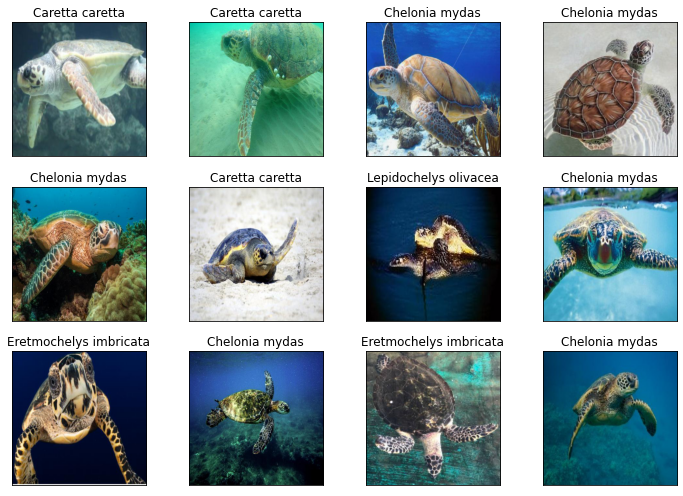

In [9]:
# Display some pictures of the dataset with their labels
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(10, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[i]))
    ax.set_title(image_df.Label[i])
plt.tight_layout()
plt.show()

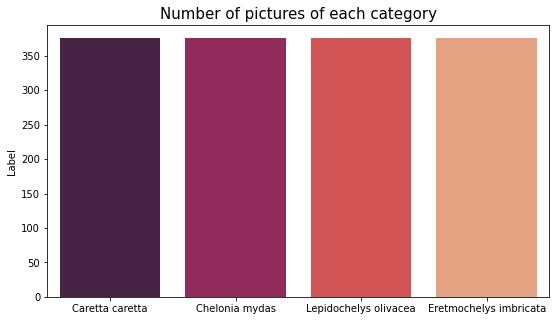

In [10]:
# Display the number of pictures of each category
import seaborn as sns
vc = image_df['Label'].value_counts()
plt.figure(figsize=(9,5))
sns.barplot(x = vc.index, y = vc, palette = "rocket")
plt.title("Number of pictures of each category", fontsize = 15)
plt.show()

In [11]:
#Shuffle
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
# Separate in train 80%
train_df, test_df = train_test_split(image_df, train_size=0.7, shuffle=True, random_state=1)
# separate test and valid into each 10%
test_df, valid_df = train_test_split(test_df, test_size=0.67, shuffle=True, random_state=1)

In [12]:
#data generator
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(rescale=1./255)

val_datagen = ImageDataGenerator(rescale=1./255)

test_datagen = ImageDataGenerator(rescale=1./255)
                                   
train_data = datagen.flow_from_dataframe(dataframe=train_df,
                                          x_col='Filepath',
                                          y_col='Label',
                                         seed=0,
                                         target_size=(224,224),
                                         batch_size=16,
                                         shuffle=True,
                                         class_mode = 'categorical',
                                        subset='training',
                                         )

val_data = val_datagen.flow_from_dataframe(dataframe=valid_df,
                                        x_col='Filepath',
                                        y_col='Label',
                                         seed=0,
                                         target_size=(224,224),
                                         batch_size=16,
                                         shuffle=False,
                                         class_mode = 'categorical',
                                         )
test_data = test_datagen.flow_from_dataframe(dataframe=test_df,
                                        x_col='Filepath',
                                        y_col='Label',
                                         seed=0,
                                         target_size=(224,224),
                                         batch_size=16,
                                         shuffle=False,
                                         class_mode = 'categorical',
                                         )

Found 1052 validated image filenames belonging to 4 classes.
Found 303 validated image filenames belonging to 4 classes.
Found 149 validated image filenames belonging to 4 classes.


# Model Parameter

In [13]:
batch_size = 16
EPOCHS = 100
WARMUP_EPOCHS = 2
LEARNING_RATE = 0.001
WARMUP_LEARNING_RATE = 1e-3
HEIGHT = 224
WIDTH = 224
CANAL = 3
N_CLASSES = 4
ES_PATIENCE = 5
RLROP_PATIENCE = 3
DECAY_DROP = 0.5

In [14]:
from keras import Model, Input
input_shape = (224,224,3)
model_input = Input(shape=input_shape)

# ** InceptionV3**


In [15]:
# Download the pre-trained weights. No top means it excludes the fully connected layer it uses for classification.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2022-08-07 17:40:24--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.79.128, 108.177.119.128, 108.177.126.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.79.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M   101MB/s    in 0.8s    

2022-08-07 17:40:25 (101 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [16]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import layers

# Set the weights file you downloaded into a variable
local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

# Initialize the base model.
# Set the input shape and remove the dense layers.
pre_trained_model = InceptionV3(input_shape=input_shape, input_tensor=model_input, include_top=False, weights=None)

# Load the pre-trained weights you downloaded.
pre_trained_model.load_weights(local_weights_file)

# Freeze the weights of the layers.
for layer in pre_trained_model.layers:
  layer.trainable = True

In [17]:
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                      

In [18]:
# Choose `mixed_7` as the last layer of your base model
last_layer = pre_trained_model.get_layer('mixed10')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 5, 5, 2048)


# Define Model Inceptionv3

In [19]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import Model
IMG_SHAPE = (224, 224, 3)
base_model =tf.keras.applications.InceptionV3(weights='imagenet', 
                                       include_top=False,
                                       input_shape=IMG_SHAPE)
x =tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
x =tf.keras.layers.Dropout(0.15)(x)
x =tf.keras.layers.Dense(256, activation='relu')(x)
x =tf.keras.layers.Dropout(0.15)(x)
final_output =tf.keras.layers.Dense(N_CLASSES, activation='softmax', name='final_output')(x)
model =tf.keras.models.Model(inputs=base_model.inputs,outputs=final_output)


87924736/87910968 [==============================] - 0s 0us/step


In [20]:
for layer in model.layers: 
    layer.trainable = False

for i in range(-5, 0):
    model.layers[i].trainable = True

metric_list = ["accuracy"]
optimizer =tf.keras.optimizers.Adam(lr=WARMUP_LEARNING_RATE)
model.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 111, 111, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 111, 111, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 Normalization)                                                                                   
                                                                                                  
 activation_107 (Activation)    (None, 25, 25, 48)   0           ['batch_normalization_107[0][0]']
                                                                                                  
 activation_110 (Activation)    (None, 25, 25, 96)   0           ['batch_normalization_110[0][0]']
                                                                                                  
 average_pooling2d_10 (AverageP  (None, 25, 25, 256)  0          ['mixed0[0][0]']                 
 ooling2D)                                                                                        
                                                                                                  
 conv2d_106 (Conv2D)            (None, 25, 25, 64)   16384       ['mixed0[0][0]']                 
          

In [21]:
import time

start = time.time()

STEP_SIZE_TRAIN = train_data.n//train_data.batch_size
STEP_SIZE_VALID = val_data.n//val_data.batch_size

history_warmup_inc = model.fit_generator(generator=train_data,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=val_data,
                                     validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

end = time.time()
print('Waktu Training:', end - start)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  del sys.path[0]


Epoch 1/2
65/65 [==============================] - 633s 10s/step - loss: 1.1675 - accuracy: 0.5328 - val_loss: 0.7585 - val_accuracy: 0.6875
Epoch 2/2
65/65 [==============================] - 8s 121ms/step - loss: 0.7423 - accuracy: 0.7085 - val_loss: 0.9209 - val_accuracy: 0.6493
Waktu Training: 701.2476470470428


In [22]:
for layer in model.layers:
  layer.trainable = True

es =tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es]
optimizer =tf.keras.optimizers.Adam(lr=LEARNING_RATE)
model.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 111, 111, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 111, 111, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 activation_105 (Activation)    (None, 25, 25, 32)   0           ['batch_normalization_105[0][0]']
                                                                                                  
 mixed0 (Concatenate)           (None, 25, 25, 256)  0           ['activation_99[0][0]',          
                                                                  'activation_101[0][0]',         
                                                                  'activation_104[0][0]',         
                                                                  'activation_105[0][0]']         
                                                                                                  
 conv2d_109 (Conv2D)            (None, 25, 25, 64)   16384       ['mixed0[0][0]']                 
                                                                                                  
 batch_normalization_109 (Batch  (None, 25, 25, 64)  192         ['conv2d_109[0][0]']             
 Normaliza

In [23]:
history_finetunning_inc = model.fit_generator(generator=train_data,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=val_data,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys


Epoch 1/100
65/65 [==============================] - 19s 157ms/step - loss: 1.1280 - accuracy: 0.5521 - val_loss: 6.5898 - val_accuracy: 0.2604
Epoch 2/100
65/65 [==============================] - 9s 131ms/step - loss: 0.7900 - accuracy: 0.7133 - val_loss: 2.6427 - val_accuracy: 0.5521
Epoch 3/100
65/65 [==============================] - 8s 127ms/step - loss: 0.6379 - accuracy: 0.7780 - val_loss: 5.9525 - val_accuracy: 0.3854
Epoch 4/100
65/65 [==============================] - 8s 129ms/step - loss: 0.5962 - accuracy: 0.7905 - val_loss: 1.7194 - val_accuracy: 0.6354
Epoch 5/100
65/65 [==============================] - 8s 128ms/step - loss: 0.4713 - accuracy: 0.8282 - val_loss: 3.1451 - val_accuracy: 0.5174
Epoch 6/100
65/65 [==============================] - 8s 127ms/step - loss: 0.4949 - accuracy: 0.8311 - val_loss: 1.9135 - val_accuracy: 0.5590
Epoch 7/100
65/65 [==============================] - 8s 127ms/step - loss: 0.3101 - accuracy: 0.8938 - val_loss: 1.9713 - val_accuracy: 0.628

# ***VISUALIZE THE RESULTS  Inceptionv3 ***

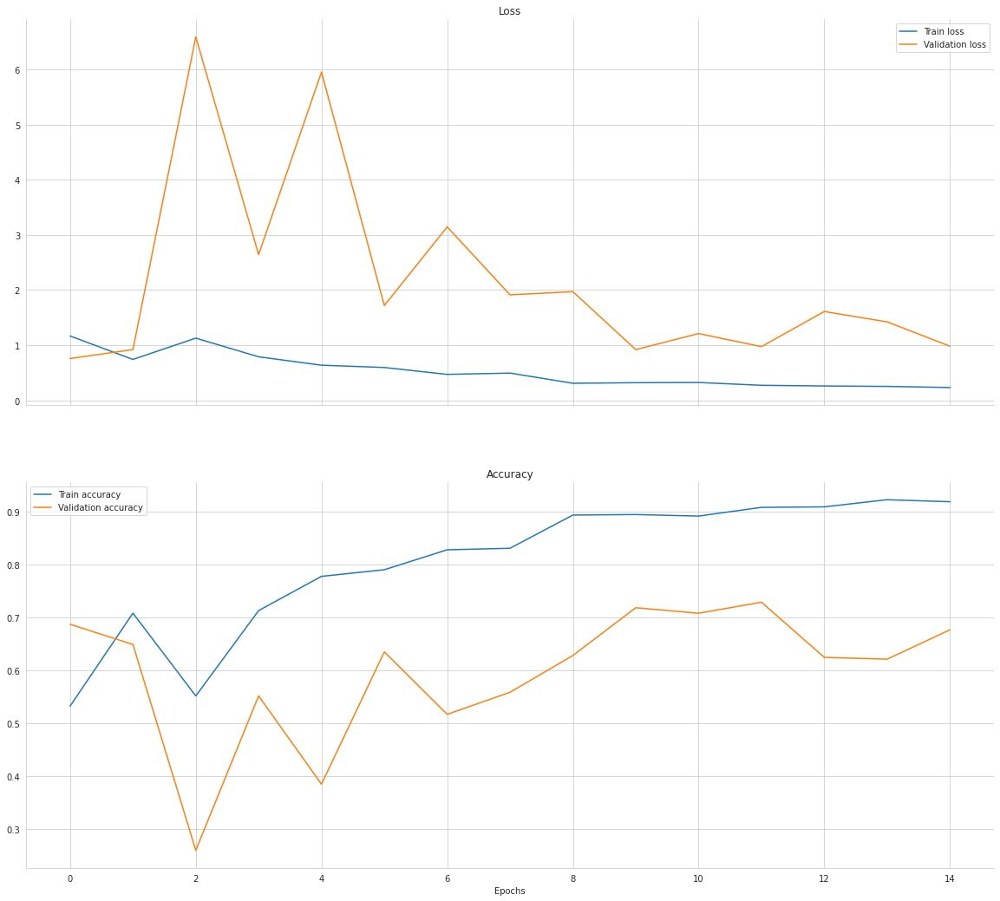

In [73]:
history_inc = {'loss': history_warmup_inc['loss'] + history_finetunning_inc['loss'], 
           'val_loss': history_warmup_inc['val_loss'] + history_finetunning_inc['val_loss'], 
           'acc': history_warmup_inc['accuracy'] + history_finetunning_inc['accuracy'], 
           'val_acc': history_warmup_inc['val_accuracy'] + history_finetunning_inc['val_accuracy']}

sns.set_style("whitegrid")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 18))

ax1.plot(history_inc['loss'], label='Train loss')
ax1.plot(history_inc['val_loss'], label='Validation loss')
ax1.legend(loc='best')
ax1.set_title('Loss')

ax2.plot(history_inc['acc'], label='Train accuracy')
ax2.plot(history_inc['val_acc'], label='Validation accuracy')
ax2.legend(loc='best')
ax2.set_title('Accuracy')

plt.xlabel('Epochs')
sns.despine()
plt.show()

In [74]:
# Predict the label of the test_images
import numpy as np
pred = model.predict(test_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Eretmochelys imbricata', 'Eretmochelys imbricata', 'Eretmochelys imbricata']


In [75]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.74      0.51      0.61        39
        Chelonia mydas       0.78      0.62      0.69        40
Eretmochelys imbricata       0.50      0.94      0.65        34
 Lepidochelys olivacea       0.81      0.58      0.68        36

              accuracy                           0.66       149
             macro avg       0.71      0.67      0.66       149
          weighted avg       0.71      0.66      0.66       149



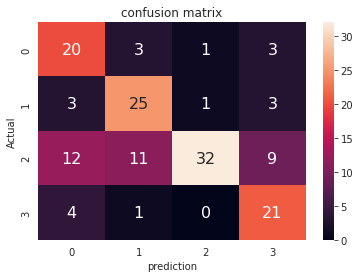

In [76]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

# DenseNet201

In [24]:
IMG_SHAPE = (224, 224, 3)
base_model_dense =tf.keras.applications.DenseNet201(weights='imagenet', 
                                       include_top=False,
                                       input_shape=IMG_SHAPE)
x_densenet =tf.keras.layers.GlobalAveragePooling2D()(base_model_dense.output)
x_densenet =tf.keras.layers.Dropout(0.15)(x_densenet)
x_densenet =tf.keras.layers.Dense(1024, activation='relu')(x_densenet)
x_densenet =tf.keras.layers.Dropout(0.15)(x_densenet)
final_output_dense =tf.keras.layers.Dense(N_CLASSES, activation='softmax', name='final_output_dense')(x_densenet)
model_densenet201 =tf.keras.models.Model(inputs=base_model_dense.inputs,outputs=final_output_dense)

74850304/74836368 [==============================] - 1s 0us/step


In [25]:
for layer in model_densenet201.layers: 
    layer.trainable = False

for i in range(-5, 0):
    model_densenet201.layers[i].trainable = True

metric_list = ["accuracy"]
optimizer =tf.keras.optimizers.Adam(lr=WARMUP_LEARNING_RATE)
model_densenet201.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_densenet201.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_3[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 n)                                                                                               
                                                                                                  
 conv2_block5_1_conv (Conv2D)   (None, 56, 56, 128)  24576       ['conv2_block5_0_relu[0][0]']    
                                                                                                  
 conv2_block5_1_bn (BatchNormal  (None, 56, 56, 128)  512        ['conv2_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block5_1_relu (Activatio  (None, 56, 56, 128)  0          ['conv2_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_blo

In [26]:
import time

start = time.time()

STEP_SIZE_TRAIN = train_data.n//train_data.batch_size
STEP_SIZE_VALID = val_data.n//val_data.batch_size

history_warmup_den = model_densenet201.fit_generator(generator=train_data,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=val_data,
                                     validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

end = time.time()
print('Waktu Training:', end - start)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  del sys.path[0]


Epoch 1/2
65/65 [==============================] - 24s 173ms/step - loss: 1.2117 - accuracy: 0.5830 - val_loss: 0.7540 - val_accuracy: 0.6944
Epoch 2/2
65/65 [==============================] - 8s 125ms/step - loss: 0.5907 - accuracy: 0.7616 - val_loss: 0.5967 - val_accuracy: 0.7708
Waktu Training: 41.387572050094604


In [27]:
for layer in model_densenet201.layers:
  layer.trainable = True

es =tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es]
optimizer =tf.keras.optimizers.Adam(lr=LEARNING_RATE)
model_densenet201.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_densenet201.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_3[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 conv2_block5_1_conv (Conv2D)   (None, 56, 56, 128)  24576       ['conv2_block5_0_relu[0][0]']    
                                                                                                  
 conv2_block5_1_bn (BatchNormal  (None, 56, 56, 128)  512        ['conv2_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block5_1_relu (Activatio  (None, 56, 56, 128)  0          ['conv2_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block5_2_conv (Conv2D)   (None, 56, 56, 32)   36864       ['conv2_block5_1_relu[0][0]']    
                                                                                                  
 conv2_blo

In [28]:
history_finetunning_den = model_densenet201.fit(train_data,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=val_data,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

Epoch 1/100
65/65 [==============================] - 40s 283ms/step - loss: 1.3154 - accuracy: 0.4807 - val_loss: 1571.9604 - val_accuracy: 0.2778
Epoch 2/100
65/65 [==============================] - 14s 215ms/step - loss: 1.0269 - accuracy: 0.5792 - val_loss: 2.1838 - val_accuracy: 0.5903
Epoch 3/100
65/65 [==============================] - 14s 215ms/step - loss: 0.8892 - accuracy: 0.6515 - val_loss: 1.4739 - val_accuracy: 0.5868
Epoch 4/100
65/65 [==============================] - 15s 225ms/step - loss: 0.7894 - accuracy: 0.7114 - val_loss: 4.5936 - val_accuracy: 0.4340
Epoch 5/100
65/65 [==============================] - 14s 211ms/step - loss: 0.7391 - accuracy: 0.7355 - val_loss: 2.3030 - val_accuracy: 0.5833
Epoch 6/100
65/65 [==============================] - 14s 211ms/step - loss: 0.5996 - accuracy: 0.7934 - val_loss: 6.6137 - val_accuracy: 0.4028
Epoch 7/100
65/65 [==============================] - 14s 218ms/step - loss: 0.5898 - accuracy: 0.7944 - val_loss: 1.3697 - val_accura

# ***VISUALIZE THE RESULTS DenseNet201***

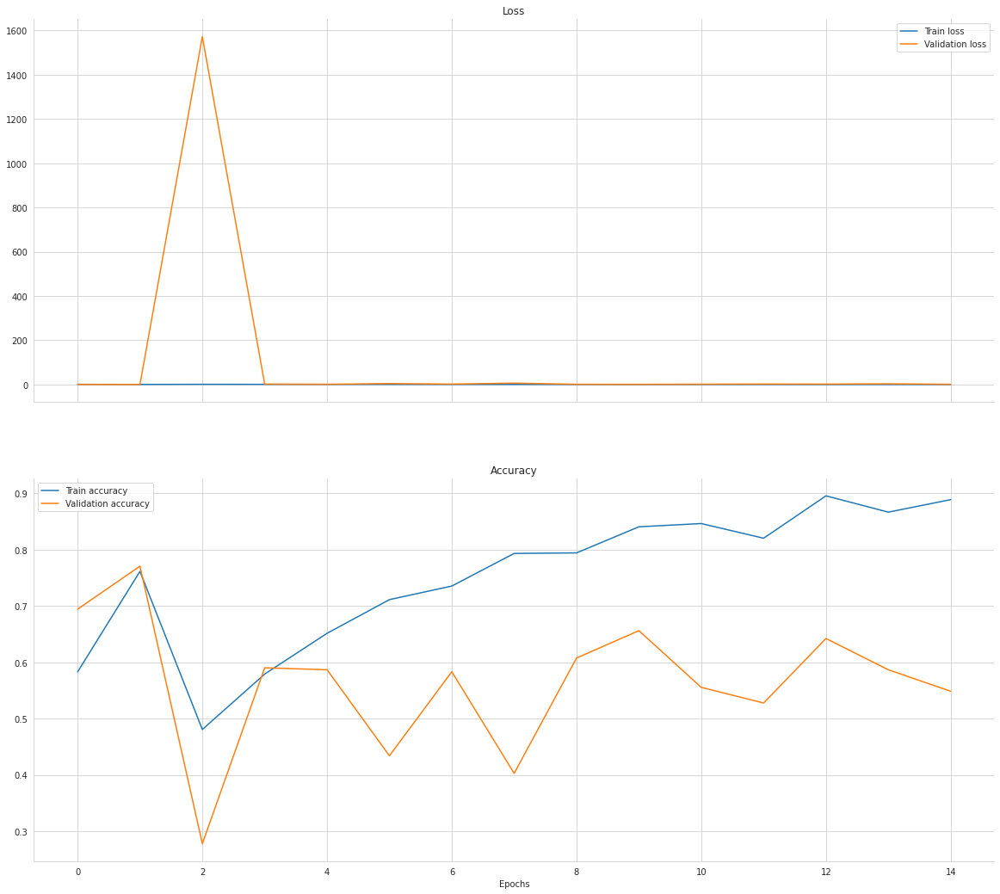

In [77]:
history_den = {'loss': history_warmup_den['loss'] + history_finetunning_den['loss'], 
           'val_loss': history_warmup_den['val_loss'] + history_finetunning_den['val_loss'], 
           'acc': history_warmup_den['accuracy'] + history_finetunning_den['accuracy'], 
           'val_acc': history_warmup_den['val_accuracy'] + history_finetunning_den['val_accuracy']}

sns.set_style("whitegrid")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 18))

ax1.plot(history_den['loss'], label='Train loss')
ax1.plot(history_den['val_loss'], label='Validation loss')
ax1.legend(loc='best')
ax1.set_title('Loss')

ax2.plot(history_den['acc'], label='Train accuracy')
ax2.plot(history_den['val_acc'], label='Validation accuracy')
ax2.legend(loc='best')
ax2.set_title('Accuracy')

plt.xlabel('Epochs')
sns.despine()
plt.show()

In [78]:
# Predict the label of the test_images
import numpy as np
pred = model_densenet201.predict(test_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Eretmochelys imbricata', 'Eretmochelys imbricata', 'Lepidochelys olivacea']


In [79]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.58      0.87      0.69        39
        Chelonia mydas       0.77      0.50      0.61        40
Eretmochelys imbricata       0.73      0.71      0.72        34
 Lepidochelys olivacea       0.81      0.69      0.75        36

              accuracy                           0.69       149
             macro avg       0.72      0.69      0.69       149
          weighted avg       0.72      0.69      0.69       149



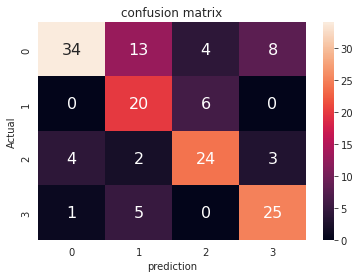

In [80]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

# `Rednet50


In [29]:
IMG_SHAPE = (224, 224, 3)
from tensorflow.keras.applications import resnet50
base_model_resnet50 =resnet50.ResNet50(weights='imagenet', 
                                       include_top=False,
                                       input_shape=IMG_SHAPE)
x_resnet50 =tf.keras.layers.GlobalAveragePooling2D()(base_model_resnet50.output)
x_resnet50 =tf.keras.layers.Dropout(0.15)(x_resnet50)
x_resnet50 =tf.keras.layers.Dense(256, activation='relu')(x_resnet50)
x_resnet50 =tf.keras.layers.Dropout(0.15)(x_resnet50)
final_output_resnet50 =tf.keras.layers.Dense(N_CLASSES, activation='softmax', name='final_output_resnet50')(x_resnet50)
model_resnet50 =tf.keras.models.Model(inputs=base_model_resnet50.inputs,outputs=final_output_resnet50)

94781440/94765736 [==============================] - 1s 0us/step


In [30]:
for layer in model_resnet50.layers: 
    layer.trainable = False

for i in range(-5, 0):
    model_resnet50.layers[i].trainable = True

metric_list = ["accuracy"]
optimizer =tf.keras.optimizers.Adam(lr=WARMUP_LEARNING_RATE)
model_resnet50.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_resnet50.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 conv3_block1_0_conv (Conv2D)   (None, 28, 28, 512)  131584      ['conv2_block3_out[0][0]']       
                                                                                                  
 conv3_block1_3_conv (Conv2D)   (None, 28, 28, 512)  66048       ['conv3_block1_2_relu[0][0]']    
                                                                                                  
 conv3_block1_0_bn (BatchNormal  (None, 28, 28, 512)  2048       ['conv3_block1_0_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block1_3_bn (BatchNormal  (None, 28, 28, 512)  2048       ['conv3_block1_3_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_blo

In [31]:
import time

start = time.time()

STEP_SIZE_TRAIN = train_data.n//train_data.batch_size
STEP_SIZE_VALID = val_data.n//val_data.batch_size

history_warmup_r50 = model_resnet50.fit(train_data,
                                     steps_per_epoch=STEP_SIZE_TRAIN,
                                     validation_data=val_data,
                                     validation_steps=STEP_SIZE_VALID,
                                     epochs=WARMUP_EPOCHS,
                                     verbose=1).history

end = time.time()
print('Waktu Training:', end - start)

Epoch 1/2
65/65 [==============================] - 13s 149ms/step - loss: 1.5127 - accuracy: 0.2770 - val_loss: 1.3941 - val_accuracy: 0.2847
Epoch 2/2
65/65 [==============================] - 8s 116ms/step - loss: 1.4069 - accuracy: 0.2954 - val_loss: 1.3299 - val_accuracy: 0.3819
Waktu Training: 21.30149483680725


In [32]:
for layer in model_resnet50.layers:
  layer.trainable = True

es =tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
rlrop =tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)

callback_list = [es]
optimizer =tf.keras.optimizers.Adam(lr=LEARNING_RATE)
model_resnet50.compile(optimizer=optimizer, loss="categorical_crossentropy",  metrics=metric_list)
model_resnet50.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 n)                                                                                               
                                                                                                  
 conv3_block1_2_conv (Conv2D)   (None, 28, 28, 128)  147584      ['conv3_block1_1_relu[0][0]']    
                                                                                                  
 conv3_block1_2_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block1_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block1_2_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block1_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_blo

In [33]:
history_finetunning_r50 = model_resnet50.fit(train_data,
                                          steps_per_epoch=STEP_SIZE_TRAIN,
                                          validation_data=val_data,
                                          validation_steps=STEP_SIZE_VALID,
                                          epochs=EPOCHS,
                                          callbacks=callback_list,
                                          verbose=1).history

Epoch 1/100
65/65 [==============================] - 16s 155ms/step - loss: 1.3803 - accuracy: 0.4228 - val_loss: 417.5045 - val_accuracy: 0.2188
Epoch 2/100
65/65 [==============================] - 9s 136ms/step - loss: 1.1231 - accuracy: 0.5212 - val_loss: 1.4818 - val_accuracy: 0.2674
Epoch 3/100
65/65 [==============================] - 9s 133ms/step - loss: 1.0429 - accuracy: 0.5647 - val_loss: 1.5899 - val_accuracy: 0.2500
Epoch 4/100
65/65 [==============================] - 9s 136ms/step - loss: 1.0297 - accuracy: 0.5705 - val_loss: 1.3854 - val_accuracy: 0.2500
Epoch 5/100
65/65 [==============================] - 9s 134ms/step - loss: 0.8895 - accuracy: 0.6438 - val_loss: 1.5298 - val_accuracy: 0.2674
Epoch 6/100
65/65 [==============================] - 9s 134ms/step - loss: 0.8107 - accuracy: 0.6689 - val_loss: 1.4469 - val_accuracy: 0.2674
Epoch 7/100
65/65 [==============================] - 9s 134ms/step - loss: 0.6977 - accuracy: 0.7288 - val_loss: 1.6459 - val_accuracy: 0.2

# ***VISUALIZE THE RESULTS Ensemble Resnet50***

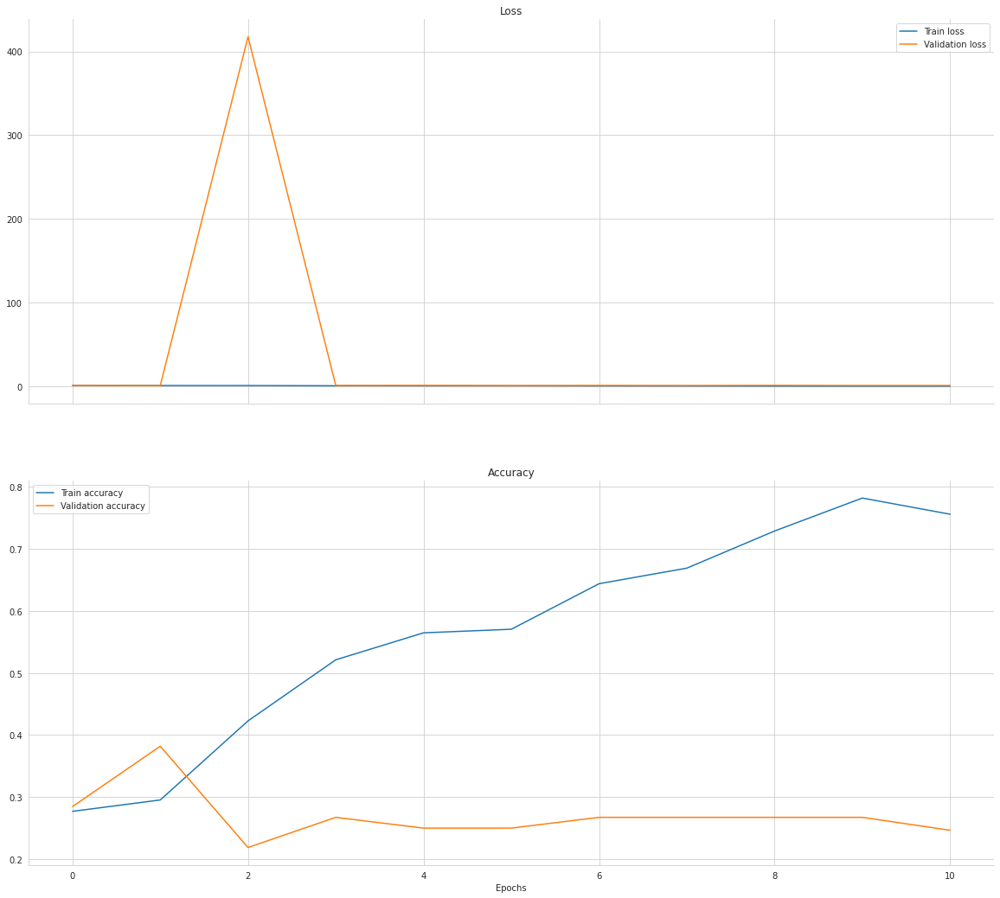

In [81]:
history_res = {'loss': history_warmup_r50['loss'] + history_finetunning_r50['loss'], 
           'val_loss': history_warmup_r50['val_loss'] + history_finetunning_r50['val_loss'], 
           'acc': history_warmup_r50['accuracy'] + history_finetunning_r50['accuracy'], 
           'val_acc': history_warmup_r50['val_accuracy'] + history_finetunning_r50['val_accuracy']}

sns.set_style("whitegrid")
fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(20, 18))

ax1.plot(history_res['loss'], label='Train loss')
ax1.plot(history_res['val_loss'], label='Validation loss')
ax1.legend(loc='best')
ax1.set_title('Loss')

ax2.plot(history_res['acc'], label='Train accuracy')
ax2.plot(history_res['val_acc'], label='Validation accuracy')
ax2.legend(loc='best')
ax2.set_title('Accuracy')

plt.xlabel('Epochs')
sns.despine()
plt.show()

In [82]:
# Predict the label of the test_images
import numpy as np
pred = model_resnet50.predict(test_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Caretta caretta', 'Caretta caretta', 'Caretta caretta', 'Caretta caretta']


In [83]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.26      1.00      0.41        39
        Chelonia mydas       0.00      0.00      0.00        40
Eretmochelys imbricata       0.00      0.00      0.00        34
 Lepidochelys olivacea       0.00      0.00      0.00        36

              accuracy                           0.26       149
             macro avg       0.07      0.25      0.10       149
          weighted avg       0.07      0.26      0.11       149



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


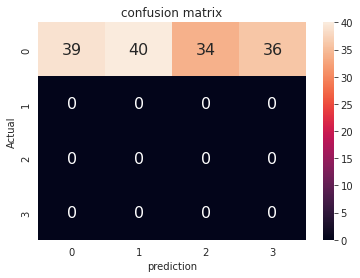

In [84]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

# Ensemble Inception & resnet50


In [34]:
models = [model, model_resnet50]
model_outputs = [model(model_input) for model in models]
ensemble_output = tf.keras.layers.Average()(model_outputs)
ensemble_model = tf.keras.Model(inputs=model_input, outputs=ensemble_output)

In [35]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [36]:
ensemble_model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# Ensemble Inception & desnet201





In [37]:
models = [model, model_densenet201]
model_outputs_ID = [model(model_input) for model in models]
ensemble_output_ID = tf.keras.layers.Average()(model_outputs_ID)
ensemble_model_ID = tf.keras.Model(inputs=model_input, outputs=ensemble_output_ID)

In [38]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [39]:
ensemble_model_ID.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# Ensemble Resnet50 & desnet201





In [40]:
models = [model, model_densenet201]
model_outputs_DR = [model(model_input) for model in models]
ensemble_output_DR = tf.keras.layers.Average()(model_outputs_DR)
ensemble_model_DR = tf.keras.Model(inputs=model_input, outputs=ensemble_output_DR)

In [41]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [42]:
ensemble_model_DR.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# Ensemble InceptionV3, Resnet50 & DenseNet201





In [64]:
models = [model, model_densenet201, model_resnet50]
model_outputs_DRI = [model(model_input) for model in models]
ensemble_output_DRI = tf.keras.layers.Average()(model_outputs_DRI)
ensemble_model_DRI = tf.keras.Model(inputs=model_input, outputs=ensemble_output_DRI)

In [65]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

In [66]:
ensemble_model_DRI.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

# ***VISUALIZE THE RESULTS Ensemble Inceptionv3 & Resnet50***

In [45]:
metrics_train = ensemble_model.evaluate(train_data)
metrics_test = ensemble_model.evaluate(test_data)

10/10 [==============================] - 54s 6s/step - loss: 0.9993 - accuracy: 0.6510


In [46]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.6771076917648315, 0.875475287437439]
--------------------------------------------
TEST_SET: [0.9992992281913757, 0.6510066986083984]


In [47]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model.predict(test_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Eretmochelys imbricata', 'Eretmochelys imbricata', 'Eretmochelys imbricata']


In [48]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.71      0.51      0.60        39
        Chelonia mydas       0.80      0.60      0.69        40
Eretmochelys imbricata       0.50      0.94      0.65        34
 Lepidochelys olivacea       0.78      0.58      0.67        36

              accuracy                           0.65       149
             macro avg       0.70      0.66      0.65       149
          weighted avg       0.70      0.65      0.65       149



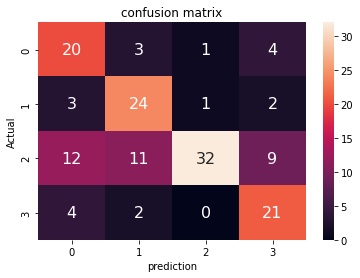

In [49]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

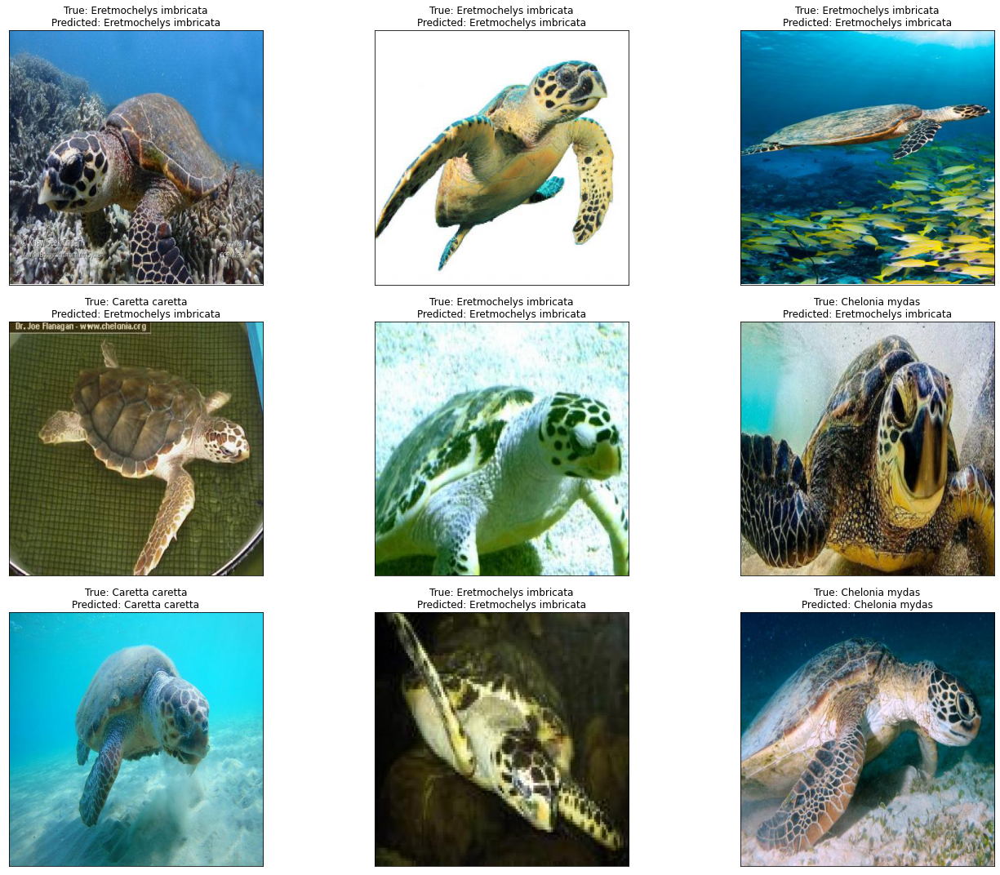

In [50]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# ***VISUALIZE THE RESULTS Ensemble Inceptionv3 & DenseNet201***

In [51]:
metrics_train = ensemble_model_ID.evaluate(train_data)
metrics_test = ensemble_model_ID.evaluate(test_data)

10/10 [==============================] - 2s 160ms/step - loss: 0.8445 - accuracy: 0.7248


In [52]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.3431037962436676, 0.9125475287437439]
--------------------------------------------
TEST_SET: [0.8445372581481934, 0.7248322367668152]


In [53]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model_ID.predict(test_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Eretmochelys imbricata', 'Eretmochelys imbricata', 'Lepidochelys olivacea']


In [54]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.63      0.85      0.73        39
        Chelonia mydas       0.84      0.53      0.65        40
Eretmochelys imbricata       0.71      0.85      0.77        34
 Lepidochelys olivacea       0.81      0.69      0.75        36

              accuracy                           0.72       149
             macro avg       0.75      0.73      0.72       149
          weighted avg       0.75      0.72      0.72       149



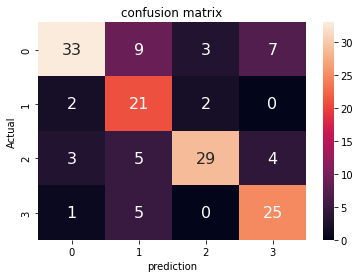

In [55]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

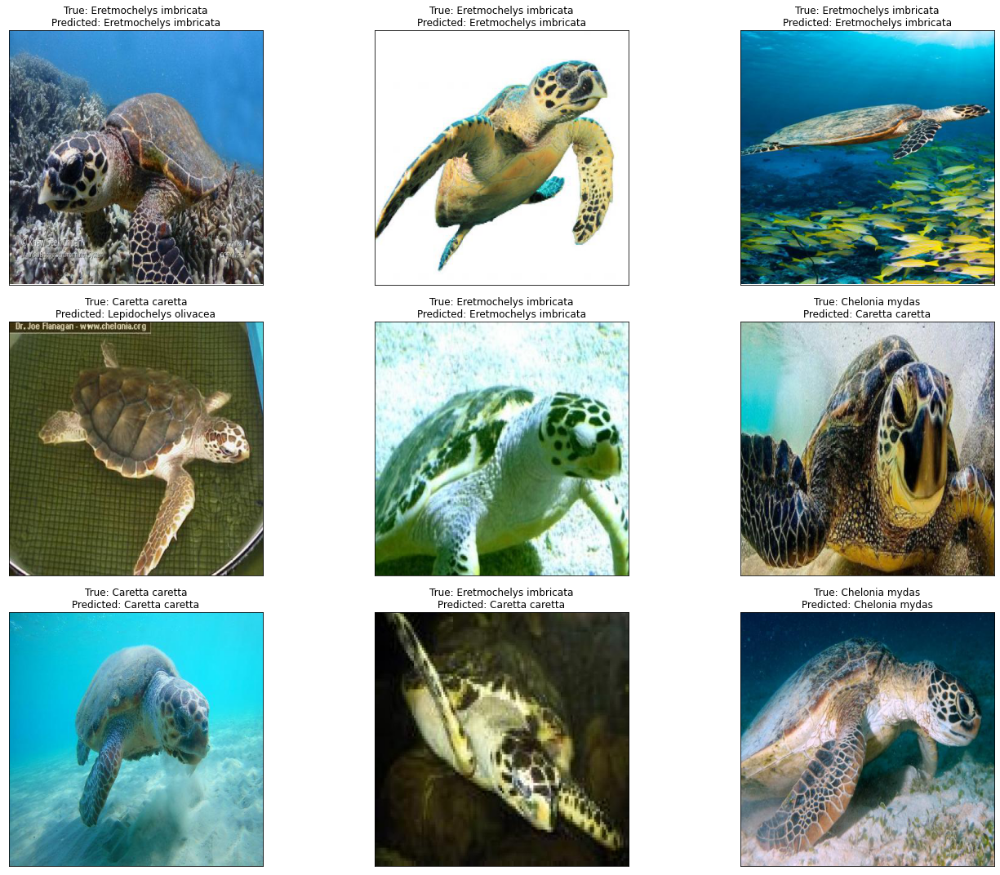

In [56]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# ***VISUALIZE THE RESULTS Ensemble Resnet50 & DenseNet201***

In [57]:
metrics_train = ensemble_model_DR.evaluate(train_data)
metrics_test = ensemble_model_DR.evaluate(test_data)

10/10 [==============================] - 2s 150ms/step - loss: 0.8445 - accuracy: 0.7248


In [58]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.34310391545295715, 0.9125475287437439]
--------------------------------------------
TEST_SET: [0.8445372581481934, 0.7248322367668152]


In [59]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model_DR.predict(test_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Eretmochelys imbricata', 'Eretmochelys imbricata', 'Lepidochelys olivacea']


In [60]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.63      0.85      0.73        39
        Chelonia mydas       0.84      0.53      0.65        40
Eretmochelys imbricata       0.71      0.85      0.77        34
 Lepidochelys olivacea       0.81      0.69      0.75        36

              accuracy                           0.72       149
             macro avg       0.75      0.73      0.72       149
          weighted avg       0.75      0.72      0.72       149



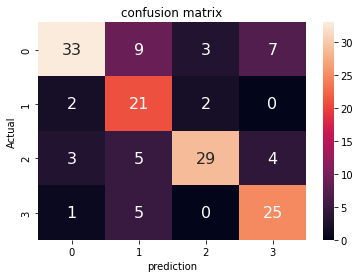

In [61]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

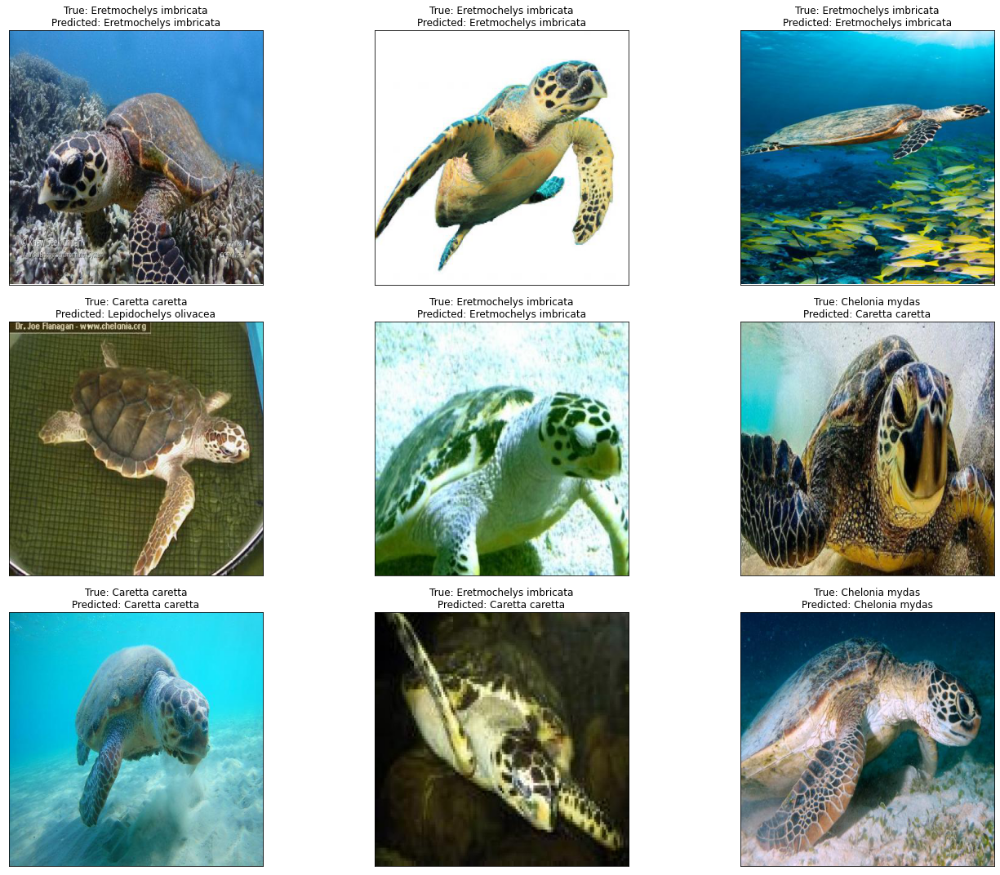

In [62]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# ***VISUALIZE THE RESULTS Ensemble Inceptionv3, Resnet50 & DenseNet201***

In [67]:
metrics_train = ensemble_model_DRI.evaluate(train_data)
metrics_test = ensemble_model_DRI.evaluate(test_data)

10/10 [==============================] - 2s 155ms/step - loss: 0.8453 - accuracy: 0.7181


In [68]:
print(f"TRAIN_SET: {metrics_train}")
print("--------------------------------------------")
print(f"TEST_SET: {metrics_test}")

TRAIN_SET: [0.5671424865722656, 0.894486665725708]
--------------------------------------------
TEST_SET: [0.845306396484375, 0.718120813369751]


In [69]:
# Predict the label of the test_images
import numpy as np
pred = ensemble_model_DRI.predict(test_data)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_data.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 4 predictions: {pred[:4]}')

The first 4 predictions: ['Eretmochelys imbricata', 'Eretmochelys imbricata', 'Eretmochelys imbricata', 'Lepidochelys olivacea']


In [70]:
#classification Report
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                        precision    recall  f1-score   support

       Caretta caretta       0.61      0.87      0.72        39
        Chelonia mydas       0.90      0.47      0.62        40
Eretmochelys imbricata       0.71      0.85      0.77        34
 Lepidochelys olivacea       0.81      0.69      0.75        36

              accuracy                           0.72       149
             macro avg       0.76      0.72      0.71       149
          weighted avg       0.76      0.72      0.71       149



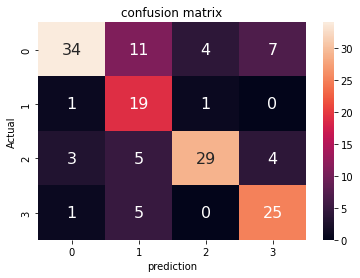

In [71]:
import seaborn as sns
import pandas as pd
cm  = confusion_matrix(pred,y_test)
df_cm = pd.DataFrame(cm, index = [i for i in range(4)],
                  columns = [i for i in range(4)])
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, fmt='d')
plt.title('confusion matrix')
plt.xlabel('prediction')
plt.ylabel('Actual');

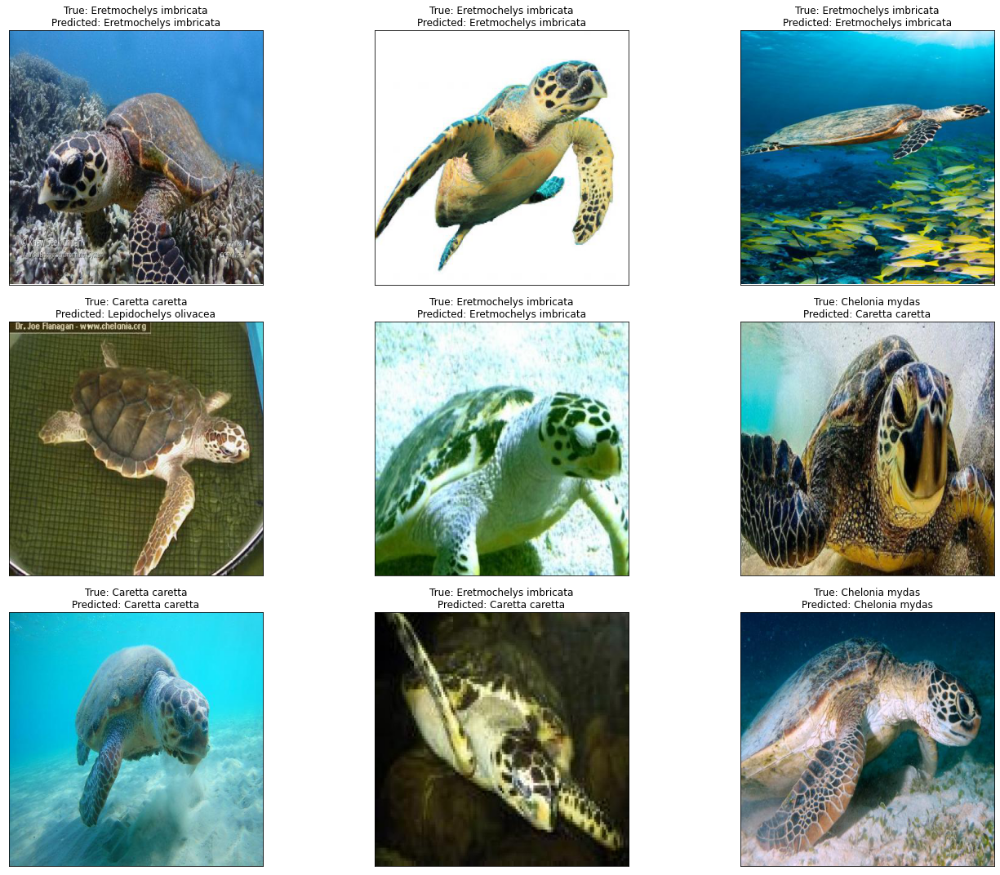

In [72]:
# Display some pictures of the dataset with their labels and the predictions
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(20, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()